In [1]:
import JSAnimation
import IPython.display

In [2]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [3]:
# Perfect sensor
def sense(x):
    return x

In [30]:
def simulate(Δt, robot, u):
    robot += Δt * u
    return robot

In [55]:
def control(t, pos):
    ### WRITE YOUR CONTROL POLICY HERE:
    kp = .5
    ki = .5
    p_d=[4,5]
    
    ux = -2*sqrt(3)*sin(t)-cos(t)#4*cos(t)*cos(pi/6)-2*sin(t)*sin(pi/6)+1
    uy = sqrt(3)*cos(t)-2*sin(t)#4*cos(t)*sin(pi/6)+2*sin(t)*cos(pi/6)+1
    return array([ux, uy])

In [59]:
tf = 10.
Δt = 0.01    # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
robot = array([6.5, 4.0])
x_log = [copy(robot)]

for t in time:
    pos = sense(robot)
    u = control(t, pos)
    robot = simulate(Δt, robot, u)
    x_log.append(copy(robot))
    
x_log = array(x_log)

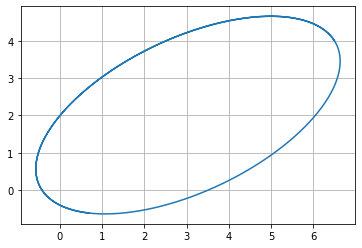

In [60]:
grid()
plot(x_log[:,0], x_log[:,1])

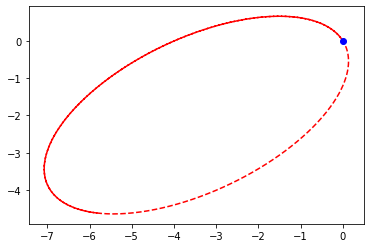

In [58]:
import matplotlib.pyplot as plt
from matplotlib import animation 
from IPython.display import HTML
    


fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    plot(x_log[:,0], x_log[:,1], 'r--')
    
    # Initial conditions
    plot(x_log[t,0], x_log[t,1], 'bo')
    
    

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())